### Import

In [1]:
# Libraries
import numpy as np
import casadi as ca
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Files
from vehicle import *
from plotting import *
from simulate import *
from mpc import *
 

### Simulation Input Parameters

In [2]:
#### MPC Properties
dt = 0.5                  # Time step [s]
N = 50                  # Time Horizon

####  Simulation/Problem Parameters
pos_constraints = [0, 50, 0, 50]         # Position Constraints [m]:    [x_min, x_max, y_min, y_max]
x_init = np.array([0, 0, 0, 0])          # Initial State: [x, y, x_dot, y_dot]
x_target = np.array([50, 50, 0, 0])      # Target State: [x, y, x_dot, y_dot]
T = 100                                   # Simulation time [s]

# Obstacle Definition: list[] obstacle = [center_x, center_y, radius]
obstacles = [[20, 40, 2], [10, 10, 2], [30, 20, 10]]

# Moving Obstacle Definition: list[] moving_obstacle = [center_x, center_y, vel_x, vel_y, radius]  
move_obstacles = [[30, 50, 0, -1, 5], [50, 40, -0.3, 0, 5]]

#### Drone Velocity & Acceleration Constraints
vel_constraints = [-1, 1, -1, 1]         # Velocity Constraints [m/s]:  [x_min, x_max, y_min, y_max] 
acc_constraints = [-1, 1, -1, 1]         # Acceleration Constraints [m/s^2]:    [x_min, x_max, y_min, y_max] 

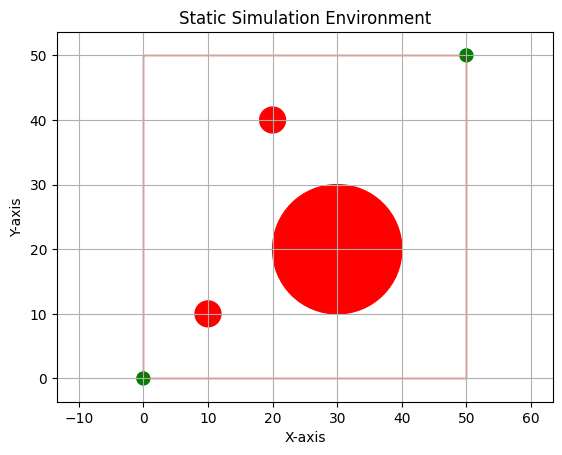

In [3]:
# Plot the static Obstacles
plot_static_obstacles(obstacles, pos_constraints, x_init, x_target)

In [4]:
%%capture
# Setup vehichle & controller then Simulate
vehicle = vehicle_SS(dt)
controller = lambda x_init, move_obstacles : mpc_control(vehicle, N, x_init, x_target, pos_constraints, vel_constraints, acc_constraints, obstacles, move_obstacles)
states, inputs, plans, timesteps = simulate(dt, T, x_init, N, controller, move_obstacles, num_states=len(x_init), num_inputs=2)

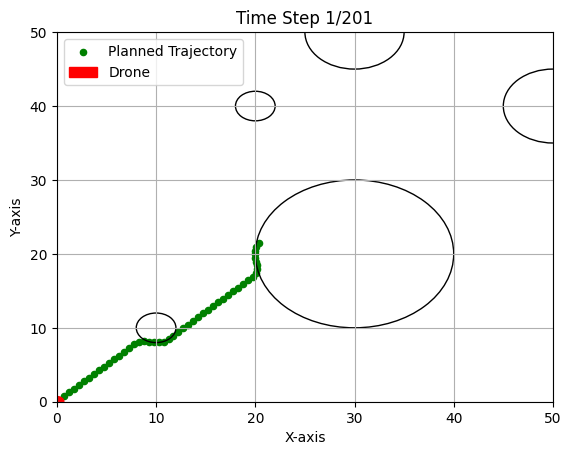

In [5]:
def update(frame):
    # Clear previous frame
    plt.cla()

    move_obstacles_update = MovingObstacleConvert(move_obstacles, frame, dt)
    
    # Plot Path for current state
    plt.scatter(plans[0][:, frame], plans[1][:, frame], c='g', s=20, label = "Planned Trajectory")

    # Plot current state
    drone = plt.Circle((states[0][frame], states[1][frame]), 0.7, color='r', fill=True, label = "Drone")
    plt.gca().add_patch(drone)
    
    for obstacle in obstacles:
        circle = plt.Circle((obstacle[0], obstacle[1]), obstacle[2], color='k', fill=False)
        plt.gca().add_patch(circle) 

    for obstacle in move_obstacles_update:
        circle = plt.Circle((obstacle[0], obstacle[1]), obstacle[2], color='k', fill=False)
        plt.gca().add_patch(circle) 


    plt.legend()
    plt.title(f'Time Step {frame + 1}/{len(states[1])}')  # Set title for each frame
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.xlim(0, 50)
    plt.ylim(0, 50)
    plt.grid()

# Create the animation
fig = plt.figure()
ani = FuncAnimation(fig, update, frames=len(states[1]), interval=100)

# Display the animation within the Jupyter Notebook using HTML
HTML(ani.to_jshtml())
